### Table of Contents

* [Step 0. INTRODUCTION TO THE PROJECT](#section_0)
* [Step 1. Getting required libaries](#section_1)

* [Step 2: Gathering Data](#chapter1)
  
    * [2.1. Tweetter-Archieve-Enhanced](#section_2)
    * [2.2. Tweet-Image-predictions](#section_3)
    * [2.3. Additional data from Tweeter-API](#section_4)
     
* [Step 3: Assessing Data](#chapter2)
    * [3.1. Data Quality and Tidyness Issues using both Programmatic and Visual assessment](#section_5)
    * [3.1.1. Visual assessment](#section_6)
    * [3.1.2.Programmatic assessment](#section_7)
    * [3.1.3. Overall Quality Issues](#section_8)
    * [3.1.4. Overall Tidyness Issues](#section_9)
    

    
* [Step 4: Cleaning Data](#chapter3)
    * [4.1. Cleanning WeRateDogs Tweetter-Archieve-Enhanced data](#section_10)
    * [4.2. Cleanning Tweet-Image-predictions data](#section_11)
    * [4.3. Cleanning Tweeter-API data](#section_12)
   
* [Step 5: Storing  data](#chapter4)
    * [5.1 Combinning All datasets into a single data frame](#section_13)
    * [5.2. Storing that dataframe containing all information](#section_14)
    
* [Step 6: Analyzing and Visualizing Data](#chapter5)
    * [6.1. Analyse each data to get some insights like for example most retweet dog etc](#section_15)
    
* [step 7: Reporting](#chapter6)
    * [7.1. Reporting data wrangling efforts](#section_16)
    * [7.2. Reporting insights obtained from data analyses and visualizations](#section_17)

## Step 0. INTRODUCTION TO THE PROJECT <a class="anchor" id="section_1"></a>

Real-world data rarely comes clean. In this project, I will be using Python and its libraries to gather data from a variety of sources and in a variety of formats, assess its quality and tidiness, then clean it for analysis which is called `Data Wrangling`.

The dataset that I will be wrangling (and analyzing and visualizing) is the `tweet archive of Twitter user @dog_rates` also know as `WeRateDogs`. the WeRateDogs is a Twitter account that rates people's dogs with a humorous comment about the dog. These ratings almost always have a denominator of 10 and the numerators almost always greater than 10.

The goal of this project: Wrangle WeRateDogs Twitter data to create interesting and trustworthy analyses and visualizations
by gathering data, then assessing and cleaning it to get better analyses.

In this project I will be working on three datasets. the first is `Enhanced Twitter Archive` which will be downloaded manually, the second is `Image predictions` which will be downloaded programmatically using requests and get methods from this URL: https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv and the third one is `data from the Twitter API` which is a JSON text data opened programmatically.


## Step 1: Getting Required Libraries  <a class="anchor" id="section_1"></a>

In [1]:
# importing required libraries for this project
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import sys
sys.path.append("..")
import os
from timeit import default_timer as timer
import json
import tweepy
import seaborn as sns
sns.set()
from PIL import Image
from io import BytesIO

## Step 2: Gathering Data  <a class="anchor" id="chapter1"></a>

### 2.1. Tweetter-Archieve-Enhanced  <a class="anchor" id="section_2"></a>

This dataset was given and downloaded manually and saved into my computer. What I need to do is to load it into the jupyter notebook

### Loading the data into pandas datafrmae

In [2]:
# Loading the tweeter archieve enhanced data and save it into pandas dataframe named df_Tweet_Archieve
df_Tweet_Archieve = pd.read_csv("twitter-archive-enhanced.csv")
df_Tweet_Archieve.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


### 2.2. Tweet-Image-predictions  <a class="anchor" id="section_3"></a>

This dataset is hosted on Udacity's servers and should be downloaded programmatically using the Requests library and the following URL: https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv

### Creating directory for the data file

In [3]:
# Make directory if it doesn't already exist
folder_name = 'wrangle data'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

### Downloading the data programmatically

In [4]:
# define the url link to find the dataset
url = "https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv"
# loading the dataset from the url link above
df_Image_prediction = requests.get(url)
df_Image_prediction
# # Now that I get the data, lets open the dataset into this jupyter notebook
# with open("image-predictions.tsv", mode='wb') as f:
#     f.write(df1.content)
    

<Response [200]>

In [5]:
with open(os.path.join(folder_name, url.split('/')[-1]), mode = 'wb') as file:
    
    file.write(df_Image_prediction.content)

### Loading the data into pandas data frame

In [6]:
# Then lets load/read the data into pandas dataframe
df_Image_pred = pd.read_csv("wrangle data/image-predictions.tsv", sep="\t")
df_Image_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


### 2.3. Additional data from Tweeter-API  <a class="anchor" id="section_4"></a>

### Reading the Json file

In [7]:
# creating empty list to store Json texts as dictionaries
Json_data_dict = []
# opening the file
with open('tweet_json.txt') as data:
    for line in data:
        #convering string file to dictionary
        Json_data_dict.append(json.loads(line))
        
# Json_data_dict

In [8]:
# creating a dictionary of tweet-ID , retweet_count and favorite_count as mentioned
Json_df_dict=[]

for dics in Json_data_dict:
    # obtaining tweet-ID from Json_data_dict
    tweet_ID= dics['id']
    # obtaining retweet_count from Json_data_dict
    retweet_count=dics['retweet_count']
    # obtaining favorite_count from Json_data_dict
    favorite_count=dics['favorite_count']
    # Appending those dics into the list created above to store those 3 dictionaries extracted
    Json_df_dict.append({'Tweet ID': tweet_ID,
                        'Retweet Count': retweet_count,
                        'Favorite Count': favorite_count})


In [9]:
# converting the list of data into pandas dataframe
tweet_Json_data = pd.DataFrame(Json_df_dict).rename(columns={"Tweet ID":"Tweet_ID", "Retweet Count":"Retweet_Count",
                                                            "Favorite Count":"Favorite_Count"}) 
tweet_Json_data.head()

,Tweet_ID,Retweet_Count,Favorite_Count
0,892420643555336193,7023,33858
1,892177421306343426,5304,29360
2,891815181378084864,3487,22074
3,891689557279858688,7235,36981
4,891327558926688256,7774,35356


## Step 3: Assessing Data <a class="anchor" id="chapter2"></a>

### 3.1. Data Quality and Tidyness Issues using both Programmatic and Visual assessment <a class="anchor" id="section_5"></a>

###  3.1.1. Visual assessment <a class="anchor" id="section_6"></a>

In [10]:
dataframes = ["df_Tweet_Archieve","df_Image_pred","tweet_Json_data"]

def Visual_assessment(df):
    # returning the first 5 rows, last 5 rows and sample 5 rows to have quick look in the data set
    return df.head(5), df.tail(5), df.sample(5)

In [11]:
Visual_assessment(df_Tweet_Archieve)

(             tweet_id  in_reply_to_status_id  in_reply_to_user_id  \
 0  892420643555336193                    NaN                  NaN   
 1  892177421306343426                    NaN                  NaN   
 2  891815181378084864                    NaN                  NaN   
 3  891689557279858688                    NaN                  NaN   
 4  891327558926688256                    NaN                  NaN   
 
                    timestamp  \
 0  2017-08-01 16:23:56 +0000   
 1  2017-08-01 00:17:27 +0000   
 2  2017-07-31 00:18:03 +0000   
 3  2017-07-30 15:58:51 +0000   
 4  2017-07-29 16:00:24 +0000   
 
                                               source  \
 0  <a href="http://twitter.com/download/iphone" r...   
 1  <a href="http://twitter.com/download/iphone" r...   
 2  <a href="http://twitter.com/download/iphone" r...   
 3  <a href="http://twitter.com/download/iphone" r...   
 4  <a href="http://twitter.com/download/iphone" r...   
 
                                  

In [12]:
Visual_assessment(df_Image_pred)

(             tweet_id                                          jpg_url  \
 0  666020888022790149  https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg   
 1  666029285002620928  https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg   
 2  666033412701032449  https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg   
 3  666044226329800704  https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg   
 4  666049248165822465  https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg   
 
    img_num                      p1   p1_conf  p1_dog                  p2  \
 0        1  Welsh_springer_spaniel  0.465074    True              collie   
 1        1                 redbone  0.506826    True  miniature_pinscher   
 2        1         German_shepherd  0.596461    True            malinois   
 3        1     Rhodesian_ridgeback  0.408143    True             redbone   
 4        1      miniature_pinscher  0.560311    True          Rottweiler   
 
     p2_conf  p2_dog                   p3   p3_conf  p3_dog  
 0  0.156665    True  

In [13]:
Visual_assessment(tweet_Json_data)

(             Tweet_ID  Retweet_Count  Favorite_Count
 0  892420643555336193           7023           33858
 1  892177421306343426           5304           29360
 2  891815181378084864           3487           22074
 3  891689557279858688           7235           36981
 4  891327558926688256           7774           35356,
                 Tweet_ID  Retweet_Count  Favorite_Count
 2022  666049248165822465             37              89
 2023  666044226329800704            115             247
 2024  666033412701032449             36             100
 2025  666029285002620928             39             112
 2026  666020888022790149            423            2293,
                 Tweet_ID  Retweet_Count  Favorite_Count
 1765  670778058496974848             62             298
 736   778624900596654080            944            4347
 38    884876753390489601           4678           24420
 1689  672139350159835138            599            1553
 447   817181837579653120           7886       

### 3.1.2. Programmatic assessment <a class="anchor" id="section_7"></a>

In [14]:
dataframes = ["df_Tweet_Archieve","df_Image_pred","tweet_Json_data"]

def Programmatic_assessment(df):
    # obtaining data frame information
    df_info = df.info()
    # obtaining summary statistics
    df_statistics = df.describe()
    # check data types
    df_datatypes = df.dtypes
    # check how many NaN values
    df_null = df.isnull().sum()
    
    # checking if there are duplicates
    for i in df.columns:
        if i=="expanded_urls":
            df = df[i]
            df_duplicates = sum(df.duplicated())
            
        elif i=="jpg_url":
            df = df[i]
            df_duplicates = sum(df.duplicated())
        else:
            df_duplicates = sum(df.duplicated())
    
    
    return df_info, df_statistics, df_datatypes, df_null,df_duplicates

In [15]:
Programmatic_assessment(df_Tweet_Archieve)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

(None,
            tweet_id  in_reply_to_status_id  in_reply_to_user_id  \
 count  2.356000e+03           7.800000e+01         7.800000e+01   
 mean   7.427716e+17           7.455079e+17         2.014171e+16   
 std    6.856705e+16           7.582492e+16         1.252797e+17   
 min    6.660209e+17           6.658147e+17         1.185634e+07   
 25%    6.783989e+17           6.757419e+17         3.086374e+08   
 50%    7.196279e+17           7.038708e+17         4.196984e+09   
 75%    7.993373e+17           8.257804e+17         4.196984e+09   
 max    8.924206e+17           8.862664e+17         8.405479e+17   
 
        retweeted_status_id  retweeted_status_user_id  rating_numerator  \
 count         1.810000e+02              1.810000e+02       2356.000000   
 mean          7.720400e+17              1.241698e+16         13.126486   
 std           6.236928e+16              9.599254e+16         45.876648   
 min           6.661041e+17              7.832140e+05          0.000000   
 25%

In [16]:
Programmatic_assessment(df_Image_pred)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


(None,
            tweet_id      img_num      p1_conf       p2_conf       p3_conf
 count  2.075000e+03  2075.000000  2075.000000  2.075000e+03  2.075000e+03
 mean   7.384514e+17     1.203855     0.594548  1.345886e-01  6.032417e-02
 std    6.785203e+16     0.561875     0.271174  1.006657e-01  5.090593e-02
 min    6.660209e+17     1.000000     0.044333  1.011300e-08  1.740170e-10
 25%    6.764835e+17     1.000000     0.364412  5.388625e-02  1.622240e-02
 50%    7.119988e+17     1.000000     0.588230  1.181810e-01  4.944380e-02
 75%    7.932034e+17     1.000000     0.843855  1.955655e-01  9.180755e-02
 max    8.924206e+17     4.000000     1.000000  4.880140e-01  2.734190e-01,
 tweet_id      int64
 jpg_url      object
 img_num       int64
 p1           object
 p1_conf     float64
 p1_dog         bool
 p2           object
 p2_conf     float64
 p2_dog         bool
 p3           object
 p3_conf     float64
 p3_dog         bool
 dtype: object,
 tweet_id    0
 jpg_url     0
 img_num     0
 p1 

In [17]:
Programmatic_assessment(tweet_Json_data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2027 entries, 0 to 2026
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Tweet_ID        2027 non-null   int64
 1   Retweet_Count   2027 non-null   int64
 2   Favorite_Count  2027 non-null   int64
dtypes: int64(3)
memory usage: 47.6 KB


(None,
            Tweet_ID  Retweet_Count  Favorite_Count
 count  2.027000e+03    2027.000000     2027.000000
 mean   7.470648e+17    2580.560434     7470.807104
 std    6.951384e+16    4346.017185    11442.812872
 min    6.660209e+17       1.000000        0.000000
 25%    6.838513e+17     531.500000     1281.500000
 50%    7.280353e+17    1229.000000     3229.000000
 75%    8.089615e+17    2964.000000     9291.000000
 max    8.924206e+17   70870.000000   145080.000000,
 Tweet_ID          int64
 Retweet_Count     int64
 Favorite_Count    int64
 dtype: object,
 Tweet_ID          0
 Retweet_Count     0
 Favorite_Count    0
 dtype: int64,
 0)

### more exploration

In [18]:
# print the names with only one or two characters
for i in df_Tweet_Archieve['name'].unique():
    if len(i)<3:
        print(i)

a
Mo
Bo
an
O
Al
my
by
Ed
JD
Jo


In [19]:
# print the names with only 3 characters
for i in df_Tweet_Archieve['name'].unique():
    if len(i)>2 and len(i)<4:
        print(i)

Jax
Ted
Jim
Gus
Rey
Aja
Jed
Leo
Ken
Max
Ava
Eli
Ash
not
Mia
one
Ike
Tom
Alf
Sky
Tyr
Moe
Sam
Ito
Doc
mad
Jay
Mya
Lou
Eve
Dex
Ace
Zoe
Blu
his
all
Sid
old
Ole
Bob
the
Obi
Evy
Tug
Jeb
Dot
Mac
Taz
Cal
Pip
Amy
Gin
Edd
Ben
Dug
Ron
Stu


In [20]:
# print the names with 4 characters
for i in df_Tweet_Archieve['name'].unique():
    if len(i)>3 and len(i)<5:
        print(i)

None
Zoey
Koda
Zeke
such
Maya
Earl
Lola
Yogi
Noah
Alfy
Koko
Gary
Jack
Emmy
Beau
Cash
Coco
Kody
Dawn
Cody
Lili
Dave
Burt
Carl
Thor
Luna
Arya
Iggy
Kyle
Odin
Tuck
Hank
Odie
Arlo
Lucy
Rory
Tobi
Kuyu
Pete
Kyro
Loki
Mutt
Bear
Kona
Phil
Toby
Nala
Gabe
Luca
Finn
Anna
Dido
Levi
Mary
Halo
Milo
Cali
Duke
Chef
Sobe
Iroh
Ruby
Mack
Juno
Lily
Newt
Nida
BeBe
Dale
Hero
Godi
Dash
Bell
Huck
very
Blue
Fizz
Chip
Grey
just
Tito
Brat
Tove
Kota
Rose
Theo
Fido
Emma
Gert
Fred
Cora
Abby
Geno
Beya
Kilo
Doug
Aqua
Axel
Remy
this
Ziva
Puff
Ivar
Otis
Suki
Ebby
Link
Ozzy
Zeus
Nico
Siba
Kanu
Opie
Kane
Sora
Lacy
Olaf
Kara
Zara
Bode
Rudy
Fiji
Rilo
Yoda
Chet
Kaia
Eazy
CeCe
Berb
Kobe
Lolo
Eriq
Durg
Fynn
Ferg
Trip
Brad
Opal
Marq
Mona
Birf
Oreo
Jeph
Tino
Lupe
Lulu
Taco
Joey
Kreg
Todo
Tess
Mike
Izzy
Chuq
Karl
Herm
Bert
Zuzu
life
Acro
Obie
Jazz
Rolf
Tuco
Mojo
Mark
Jett
Sage
Andy
Creg
Bloo
Herb
Liam
Skye
Kirk
Ralf
Chaz
Bobb
Hanz
Zeek
Maks
DayZ
Erik
Kial
Dook
Hall
Fwed
Keet


In [21]:
# print the names with 5 or more characters
for i in df_Tweet_Archieve['name'].unique():
    if len(i)>=5:
        print(i)

Phineas
Tilly
Archie
Darla
Franklin
Cassie
Bruno
Stuart
Oliver
Ralphus
Canela
Gerald
Jeffrey
Mingus
Derek
Roscoe
Waffles
Jimbo
Maisey
Lilly
Kevin
Bella
Grizzwald
Rusty
Stanley
Elliot
Louis
Jesse
Romeo
Bailey
Duddles
Steven
Snoopy
Shadow
Terrance
Penny
Dante
Nelly
Ginger
Benedict
Venti
Goose
Nugget
Sebastian
Walter
Sierra
Monkey
Harry
Lassie
Rover
Napolean
Boomer
Rumble
Clifford
quite
Dewey
Scout
Gizmo
Cooper
Harold
Shikha
Jamesy
Sammy
Meatball
Paisley
Albus
Neptune
Quinn
Belle
Zooey
Jersey
Hobbes
Lorenzo
Jordy
Milky
Trooper
Winston
Sophie
Wyatt
Rosie
Oscar
Callie
Cermet
George
Marlee
Einstein
Alice
Rumpole
Benny
Aspen
Jarod
Wiggles
General
Sailor
Astrid
Snoop
Riley
Gidget
Noosh
Jerry
Charlie
Georgie
Rontu
Cannon
Furzey
Daisy
Barney
Vixen
Jarvis
Mimosa
Pickles
Bungalo
Brady
Margo
Sadie
Tycho
Stephan
Indie
Winnie
Bentley
Maddie
Pipsy
Monty
Sojourner
Sunny
Vincent
Clark
Mookie
Meera
Buddy
Tucker
Chester
Wilson
Sunshine
Lipton
Gabby
Bronte
Poppy
Rhino
Willow
Orion
Eevee
Smiley
Logan
Moreto

### 3.1.3. Overall quality issues <a class="anchor" id="section_8"></a>

1. There are NaN values in Tweet-Archieve_enhanced dataset
2. There are duplicates in the links to the images for both tweet archieve enhanced data and image predictions data in the jpg_url and expanded_urls columns
3. timestamp is object and should be date time
4. In some columns of tweet archieve data, it said None and means NaN value or NaN name i.e None should be converted to NaN which is familiar keyword in pandas
5. There are some invalid names from tweet archieve data in name column such as a,Jo,not, Stu, JD, by, O, Mo, Bo, an, Al,one, my, by,Ed, None while others start with lowercase letter i.e invalid names are those starting with lowercase letters and those with only one or two characters
6. for some dogs the numerators are less than the denomunators and in some dogs the denomunators are the values other than 10 i.e they do not follow dog ratings general rule where the numerator must be a number greater than denomunator and the denominator is always 10

7. There are mixing of writing names in the image-prediction data set in [p1,p2 and p3] columns where some names start with capital/uppercase letters while others start with small/lowercase letters and in addition some words have undescores others have not

8. for each data frame, tweet-IDs are provided as integers (numbers) which can be used while performing calculations and this should be converted in strings as they are representing personnel using the tweet account



### 3.1.3. Overall Tidyness issues <a class="anchor" id="section_9"></a>

1. Those 4 dog categories (doggo, floofer, pupper and puppo) should be combined to form a single categorical column called for example dog type or dog category
2. All those 3 dataframes should be joined to form one final data frame since they are all providing informations of similar tweets which is "image predictions"

## Step 4: Cleaning Data <a class="anchor" id="chapter3"></a>

### 4.1: Cleanning WeRateDogs Tweetter-Archieve-Enhanced data <a class="anchor" id="section_10"></a>

In [22]:
# copy the data frame to be cleaned into the new data frame

df_Tweet_Archieve_clean = df_Tweet_Archieve.copy()


In [23]:
# dealing with NaN values
# printing the percentage of NaN values in each column of the data frame
df_Tweet_Archieve_clean.isnull().sum() / len(df_Tweet_Archieve_clean)

tweet_id                      0.000000
in_reply_to_status_id         0.966893
in_reply_to_user_id           0.966893
timestamp                     0.000000
source                        0.000000
text                          0.000000
retweeted_status_id           0.923175
retweeted_status_user_id      0.923175
retweeted_status_timestamp    0.923175
expanded_urls                 0.025042
rating_numerator              0.000000
rating_denominator            0.000000
name                          0.000000
doggo                         0.000000
floofer                       0.000000
pupper                        0.000000
puppo                         0.000000
dtype: float64

In [24]:
# all the columns with above 90% of the data are NaN values should be dropped
Hight_Null_cols = ['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id',
                  'retweeted_status_timestamp']
# drop columns with high percentage data are Null
df_Tweet_Archieve_clean = df_Tweet_Archieve_clean.drop(columns=Hight_Null_cols)


In [25]:
# display the first five rows to check
df_Tweet_Archieve_clean.head()

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [26]:
# check the remaining NaN values
df_Tweet_Archieve_clean.isnull().sum()

tweet_id               0
timestamp              0
source                 0
text                   0
expanded_urls         59
rating_numerator       0
rating_denominator     0
name                   0
doggo                  0
floofer                0
pupper                 0
puppo                  0
dtype: int64

In [27]:
# Since the expanded_urls columns is too sensitive with the image prediction, drop the remaining NaN values in this column
df_Tweet_Archieve_clean = df_Tweet_Archieve_clean.dropna()
# check if all missing values are handled
df_Tweet_Archieve_clean.isnull().sum()

tweet_id              0
timestamp             0
source                0
text                  0
expanded_urls         0
rating_numerator      0
rating_denominator    0
name                  0
doggo                 0
floofer               0
pupper                0
puppo                 0
dtype: int64

In [28]:
# drop duplicates in the expanded_urls column
df_Tweet_Archieve_clean.drop_duplicates(subset='expanded_urls', keep='first',inplace=True)

# check
sum(df_Tweet_Archieve_clean['expanded_urls'].duplicated())

0

In [29]:
# changing timestamp column into date time
df_Tweet_Archieve_clean['timestamp'] = pd.to_datetime(df_Tweet_Archieve_clean['timestamp'])
# check
df_Tweet_Archieve_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2218 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2218 non-null   int64              
 1   timestamp           2218 non-null   datetime64[ns, UTC]
 2   source              2218 non-null   object             
 3   text                2218 non-null   object             
 4   expanded_urls       2218 non-null   object             
 5   rating_numerator    2218 non-null   int64              
 6   rating_denominator  2218 non-null   int64              
 7   name                2218 non-null   object             
 8   doggo               2218 non-null   object             
 9   floofer             2218 non-null   object             
 10  pupper              2218 non-null   object             
 11  puppo               2218 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(3

In [30]:
# Dropping rows corresponding to an invalid dog name. 
# invalid dog names are those names with one or two characters, names starting with lowercase
# Therefore, as we are dealing with dogs, rows with invalind dog name are not necessary, then we should drop them

invalid_names = [i for i in list(df_Tweet_Archieve_clean.name) if i.islower() or len(i)<3]
print(f'there are {len(invalid_names)} invalid names')

there are 120 invalid names


In [31]:
# creating a list of invalid names without repetition of names
Invalid_names = list(set(invalid_names))

In [32]:
# drop rows corresponding to invalid names:

for name in Invalid_names:
    df_Tweet_Archieve_clean.drop(df_Tweet_Archieve_clean[df_Tweet_Archieve_clean['name'] == name].index, inplace = True)

In [33]:
# check if all invalid names were handled
invalid_names = [i for i in list(df_Tweet_Archieve_clean.name) if i.islower() or len(i)<3]
print(f'there are {len(invalid_names)} invalid names')

there are 0 invalid names


In [34]:
# checking the shape of the dataframe
df_Tweet_Archieve_clean.shape

(2098, 12)

In [35]:
# converting None into pandas familiar word NaN which is easy to handle
df_Tweet_Archieve_clean = df_Tweet_Archieve_clean.replace("None", np.nan)

# check
df_Tweet_Archieve_clean.head()

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,NaN,NaN,NaN,NaN
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,NaN,NaN,NaN,NaN
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,NaN,NaN,NaN,NaN
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,NaN,NaN,NaN,NaN
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,NaN,NaN,NaN,NaN


In [36]:
# fixing numerators and denomunators to follow the dog ratings general rule
# Now let's get the indexes with invalid numerators and denomunators

# # Invalid numerators
# Invalid_numerators = list(df_Tweet_Archieve_clean.query("rating_numerator < 10").index)

# Invalid denomunators
Invalid_denomunators = list(df_Tweet_Archieve_clean.query("rating_denominator != 10").index)
Invalid_denomunators

[433,
 516,
 784,
 902,
 1165,
 1202,
 1228,
 1254,
 1274,
 1433,
 1634,
 1635,
 1662,
 1779,
 1843]

In [37]:
df_Tweet_Archieve_clean

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,NaN,NaN,NaN,NaN
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,NaN,NaN,NaN,NaN
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,NaN,NaN,NaN,NaN
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,NaN,NaN,NaN,NaN
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2342,666082916733198337,2015-11-16 02:38:37+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a well-established sunblockerspan...,https://twitter.com/dog_rates/status/666082916...,6,10,NaN,NaN,NaN,NaN,NaN
2343,666073100786774016,2015-11-16 01:59:36+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Let's hope this flight isn't Malaysian (lol). ...,https://twitter.com/dog_rates/status/666073100...,10,10,NaN,NaN,NaN,NaN,NaN
2344,666071193221509120,2015-11-16 01:52:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a northern speckled Rhododendron....,https://twitter.com/dog_rates/status/666071193...,9,10,NaN,NaN,NaN,NaN,NaN
2351,666049248165822465,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,https://twitter.com/dog_rates/status/666049248...,5,10,NaN,NaN,NaN,NaN,NaN


In [38]:
# dropping both invalid numerators and invalid denominators indexes
# dropping invalid numerators
# df_Tweet_Archieve_clean.drop(index=Invalid_numerators, inplace=True)
# dropping invalid denomunators
df_Tweet_Archieve_clean.drop(index=Invalid_denomunators, inplace=True)

In [39]:
# check the shape of the data frame
df_Tweet_Archieve_clean.shape

(2083, 12)

In [40]:
# TEST
df_Tweet_Archieve_clean.query("rating_numerator < 10")

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
45,883482846933004288,2017-07-08 00:28:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Bella. She hopes her smile made you sm...,https://twitter.com/dog_rates/status/883482846...,5,10,Bella,NaN,NaN,NaN,NaN
229,848212111729840128,2017-04-01 16:35:01+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Jerry. He's doing a distinguished tong...,https://twitter.com/dog_rates/status/848212111...,6,10,Jerry,NaN,NaN,NaN,NaN
315,835152434251116546,2017-02-24 15:40:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",When you're so blinded by your systematic plag...,https://twitter.com/dog_rates/status/835152434...,0,10,NaN,NaN,NaN,NaN,NaN
462,817502432452313088,2017-01-06 22:45:43+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Herschel. He's slightly bi...,https://twitter.com/dog_rates/status/692417313...,7,10,Herschel,NaN,NaN,pupper,NaN
485,814578408554463233,2016-12-29 21:06:41+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Beau &amp; Wilbur. Wilbur ...,https://twitter.com/dog_rates/status/698195409...,9,10,Beau,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2341,666094000022159362,2015-11-16 03:22:39+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This appears to be a Mongolian Presbyterian mi...,https://twitter.com/dog_rates/status/666094000...,9,10,NaN,NaN,NaN,NaN,NaN
2342,666082916733198337,2015-11-16 02:38:37+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a well-established sunblockerspan...,https://twitter.com/dog_rates/status/666082916...,6,10,NaN,NaN,NaN,NaN,NaN
2344,666071193221509120,2015-11-16 01:52:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a northern speckled Rhododendron....,https://twitter.com/dog_rates/status/666071193...,9,10,NaN,NaN,NaN,NaN,NaN
2351,666049248165822465,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,https://twitter.com/dog_rates/status/666049248...,5,10,NaN,NaN,NaN,NaN,NaN


In [41]:
df_Tweet_Archieve_clean.query("rating_denominator != 10")

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [42]:
df_Tweet_Archieve_clean['rating_denominator'].unique()

array([10], dtype=int64)

for each data frame, tweet-IDs are provided as integers (numbers) which can be used while performing calculations and this should be converted in strings as they are representing personnel using the tweet account


In [43]:
# changing tweet-IDs into the string
df_Tweet_Archieve_clean["tweet_id"] = df_Tweet_Archieve_clean["tweet_id"].astype('string')
# check
df_Tweet_Archieve_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2083 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2083 non-null   string             
 1   timestamp           2083 non-null   datetime64[ns, UTC]
 2   source              2083 non-null   object             
 3   text                2083 non-null   object             
 4   expanded_urls       2083 non-null   object             
 5   rating_numerator    2083 non-null   int64              
 6   rating_denominator  2083 non-null   int64              
 7   name                1427 non-null   object             
 8   doggo               84 non-null     object             
 9   floofer             10 non-null     object             
 10  pupper              229 non-null    object             
 11  puppo               26 non-null     object             
dtypes: datetime64[ns, UTC](1), int64(2

### 4.2. Cleanning Tweet-Image-predictions data <a class="anchor" id="section_11"></a>

In [44]:
# copy the data frame to be cleaned into the new data frame
df_Image_pred_clean = df_Image_pred.copy()

In [45]:
# drop duplicates in the expanded_urls column
df_Image_pred_clean.drop_duplicates(subset='jpg_url', keep='first',inplace=True)

# check
sum(df_Image_pred_clean['jpg_url'].duplicated())

0

There are mixing of writing names in the image-prediction data set in [p1,p2 and p3] columns where some names start with capital/uppercase letters while others start with small/lowercase letters and in addition some words have undescores others have not
replace undescores with empty space and start first letter of the name with a capital letter

In [46]:
# Ref: https://www.geeksforgeeks.org/capitalize-first-letter-of-a-column-in-pandas-dataframe/
# Starting the fist letter of the name with an Uppercase letter and replacing underscores with empty space in p1,p1 and p3

# Replacing underscores by empty space
df_Image_pred_clean[['p1','p2','p3']] = df_Image_pred_clean[['p1','p2','p3']].replace("_"," ",regex=True)

    

In [47]:
# # Uppercasing the first letter for each word
cols = ['p1','p2','p3']

for col in cols:
    df_Image_pred_clean[col] = df_Image_pred_clean[col].str.capitalize()

In [48]:
# print the first five rows to check
df_Image_pred_clean.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh springer spaniel,0.465074,True,Collie,0.156665,True,Shetland sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,Redbone,0.506826,True,Miniature pinscher,0.074192,True,Rhodesian ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German shepherd,0.596461,True,Malinois,0.138584,True,Bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian ridgeback,0.408143,True,Redbone,0.360687,True,Miniature pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,Miniature pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [49]:
# changing tweet-IDs into the string
df_Image_pred_clean["tweet_id"] = df_Image_pred_clean["tweet_id"].astype('string')
# check
df_Image_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2009 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2009 non-null   string 
 1   jpg_url   2009 non-null   object 
 2   img_num   2009 non-null   int64  
 3   p1        2009 non-null   object 
 4   p1_conf   2009 non-null   float64
 5   p1_dog    2009 non-null   bool   
 6   p2        2009 non-null   object 
 7   p2_conf   2009 non-null   float64
 8   p2_dog    2009 non-null   bool   
 9   p3        2009 non-null   object 
 10  p3_conf   2009 non-null   float64
 11  p3_dog    2009 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(4), string(1)
memory usage: 162.8+ KB


### 4.3. Cleanning Tweeter-API data <a class="anchor" id="section_12"></a>

In [50]:
# copy the data frame to be cleaned into the new data frame
tweet_Json_data_clean = tweet_Json_data.copy()

In [51]:
# changing tweet-IDs into the string
tweet_Json_data_clean["Tweet_ID"] = tweet_Json_data_clean["Tweet_ID"].astype('string')
# check
tweet_Json_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2027 entries, 0 to 2026
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Tweet_ID        2027 non-null   string
 1   Retweet_Count   2027 non-null   int64 
 2   Favorite_Count  2027 non-null   int64 
dtypes: int64(2), string(1)
memory usage: 47.6 KB


In [52]:
# renaming column
tweet_Json_data_clean = tweet_Json_data_clean.rename(columns={"Tweet_ID":"tweet_id"})
tweet_Json_data_clean.head()

,tweet_id,Retweet_Count,Favorite_Count
0,892420643555336193,7023,33858
1,892177421306343426,5304,29360
2,891815181378084864,3487,22074
3,891689557279858688,7235,36981
4,891327558926688256,7774,35356


## Tidyness Issues

In [53]:
# Combining 4 dog categories into a single dog category named dog-type

# Initializing dog_type column to the data frame
df_Tweet_Archieve_clean['dog_type'] = "No type"

#loop through those categorical columns of dog types and their indexes
for i, row in df_Tweet_Archieve_clean.iterrows():
   
    # adding a category to its corresponding dog type 
   
    if row['doggo'] == 'doggo':
        df_Tweet_Archieve_clean.at[i, 'dog_type'] = 'doggo'
    elif row['floofer'] == 'floofer':
        df_Tweet_Archieve_clean.at[i, 'dog_type'] = 'floofer'
    elif row['pupper'] == 'pupper':
        df_Tweet_Archieve_clean.at[i, 'dog_type'] = 'pupper'
    elif row['puppo'] == 'puppo':
        df_Tweet_Archieve_clean.at[i, 'dog_type'] = 'puppo'



In [54]:
# check
df_Tweet_Archieve_clean.head(10)

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,dog_type
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,NaN,NaN,NaN,NaN,No type
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,NaN,NaN,NaN,NaN,No type
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,NaN,NaN,NaN,NaN,No type
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,NaN,NaN,NaN,NaN,No type
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,NaN,NaN,NaN,NaN,No type
5,891087950875897856,2017-07-29 00:08:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,13,10,NaN,NaN,NaN,NaN,NaN,No type
6,890971913173991426,2017-07-28 16:27:12+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,NaN,NaN,NaN,NaN,No type
7,890729181411237888,2017-07-28 00:22:40+00:00,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,13,10,NaN,NaN,NaN,NaN,NaN,No type
8,890609185150312448,2017-07-27 16:25:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,NaN,NaN,NaN,NaN,No type
9,890240255349198849,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,NaN,NaN,NaN,doggo


In [55]:
# Then lets drop the four columns of dog categories we have before (doggo, floofer, pupper and puppo)
df_Tweet_Archieve_clean.drop(columns=['doggo','floofer','pupper','puppo'], inplace=True)
# change the data type of dog_type column created
df_Tweet_Archieve_clean['dog_type'] = df_Tweet_Archieve_clean['dog_type'].astype('category')

In [56]:
# Check
df_Tweet_Archieve_clean.head()

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_type
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,No type
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,No type
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,No type
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,No type
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,No type


In [57]:
df_Tweet_Archieve_clean['dog_type'].value_counts()

No type    1746
pupper      219
doggo        84
puppo        25
floofer       9
Name: dog_type, dtype: int64

In [58]:
# Now lets merge or join all the 3 data frames since they are all providing informations of similar tweets
df1 = df_Image_pred_clean.merge(tweet_Json_data_clean,on='tweet_id')

df_final = df1.merge(df_Tweet_Archieve_clean, on='tweet_id')
df_final.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,...,Retweet_Count,Favorite_Count,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_type
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh springer spaniel,0.465074,True,Collie,0.156665,True,Shetland sheepdog,...,423,2293,2015-11-15 22:32:08+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,https://twitter.com/dog_rates/status/666020888...,8,10,NaN,No type
1,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,Miniature pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,...,37,89,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,https://twitter.com/dog_rates/status/666049248...,5,10,NaN,No type
2,666071193221509120,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,1,Gordon setter,0.503672,True,Yorkshire terrier,0.174201,True,Pekinese,...,51,127,2015-11-16 01:52:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a northern speckled Rhododendron....,https://twitter.com/dog_rates/status/666071193...,9,10,NaN,No type
3,666073100786774016,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,1,Walker hound,0.260857,True,English foxhound,0.175382,True,Ibizan hound,...,132,274,2015-11-16 01:59:36+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Let's hope this flight isn't Malaysian (lol). ...,https://twitter.com/dog_rates/status/666073100...,10,10,NaN,No type
4,666082916733198337,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,1,Pug,0.489814,True,Bull mastiff,0.404722,True,French bulldog,...,37,93,2015-11-16 02:38:37+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a well-established sunblockerspan...,https://twitter.com/dog_rates/status/666082916...,6,10,NaN,No type


In [59]:
# check the final data frame shape
df_final.shape

(1559, 22)

## Step 5: Storing Data <a class="anchor" id="chapter4"></a>

## 5.1 Combinning All datasets into a single data frame <a class="anchor" id="section_13"></a>

In [60]:
# Now lets merge or join all the 3 data frames since they are all providing informations of similar tweets
df1 = df_Image_pred_clean.merge(tweet_Json_data_clean,on='tweet_id')

df_final = df1.merge(df_Tweet_Archieve_clean, on='tweet_id')
df_final.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,...,Retweet_Count,Favorite_Count,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_type
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh springer spaniel,0.465074,True,Collie,0.156665,True,Shetland sheepdog,...,423,2293,2015-11-15 22:32:08+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,https://twitter.com/dog_rates/status/666020888...,8,10,NaN,No type
1,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,Miniature pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,...,37,89,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,https://twitter.com/dog_rates/status/666049248...,5,10,NaN,No type
2,666071193221509120,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,1,Gordon setter,0.503672,True,Yorkshire terrier,0.174201,True,Pekinese,...,51,127,2015-11-16 01:52:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a northern speckled Rhododendron....,https://twitter.com/dog_rates/status/666071193...,9,10,NaN,No type
3,666073100786774016,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,1,Walker hound,0.260857,True,English foxhound,0.175382,True,Ibizan hound,...,132,274,2015-11-16 01:59:36+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Let's hope this flight isn't Malaysian (lol). ...,https://twitter.com/dog_rates/status/666073100...,10,10,NaN,No type
4,666082916733198337,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,1,Pug,0.489814,True,Bull mastiff,0.404722,True,French bulldog,...,37,93,2015-11-16 02:38:37+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a well-established sunblockerspan...,https://twitter.com/dog_rates/status/666082916...,6,10,NaN,No type


In [61]:
df_final.shape

(1559, 22)

## 5.2. Storing that dataframe containing all information <a class="anchor" id="section_14"></a>

In [62]:
df_final.to_csv('twitter_archive_master.csv', index = False)

## Step 6: Analyzing and Visualizing Data <a class="anchor" id="chapter5"></a>

## 6.1. Analyse each data to get some insights like for example most retweet dog etc <a class="anchor" id="section_15"></a>

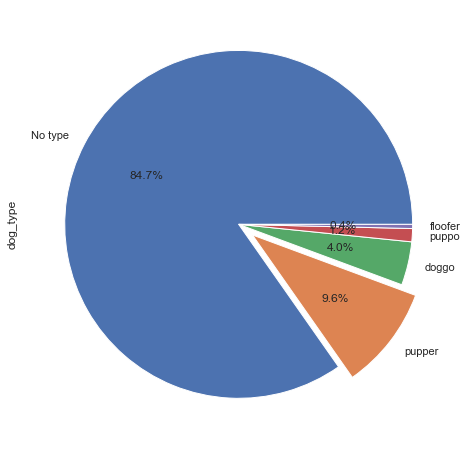

In [63]:
# Using pie chart to rate dogs according to their categories or type
plt.figure(figsize=(14,8))
explode = (0, 0.1, 0, 0,0)
df_final['dog_type'].value_counts().plot(kind='pie',explode=explode,autopct='%1.1f%%');

Therefore, from the graph above, we can confirm that the most rated dogs have not category i.e no type dogs, followed by pupper dogs, then doggo dogs, then puppo dogs and final floofer dogs get the smallest ratings.

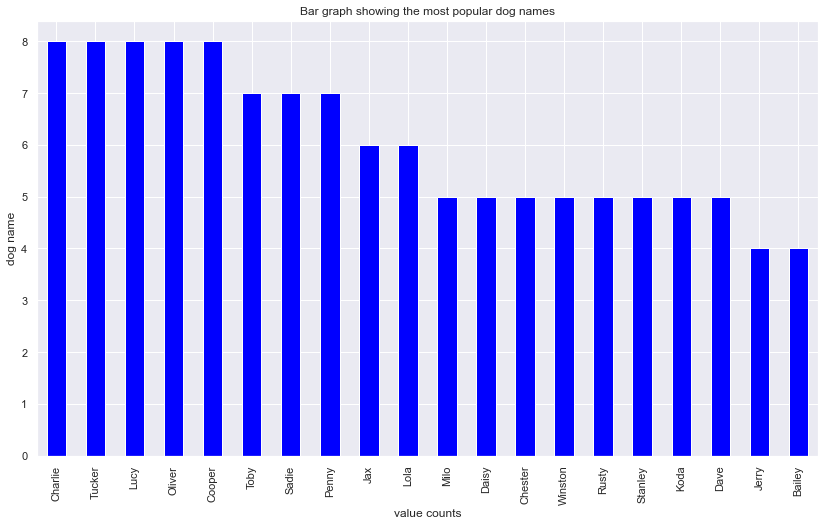

In [64]:
# let's also explore the most popular dogs from the dataset
plt.figure(figsize=(14,8))
df_final['name'].value_counts().head(20).plot(kind="bar", color='blue')
plt.title("Bar graph showing the most popular dog names")
plt.xlabel('value counts')
plt.ylabel('dog name');

Therefore, we can see that "Lucy, Oliver and Charlie" are the most popular names followed by "cooper, Sadie and Tucker" and so on

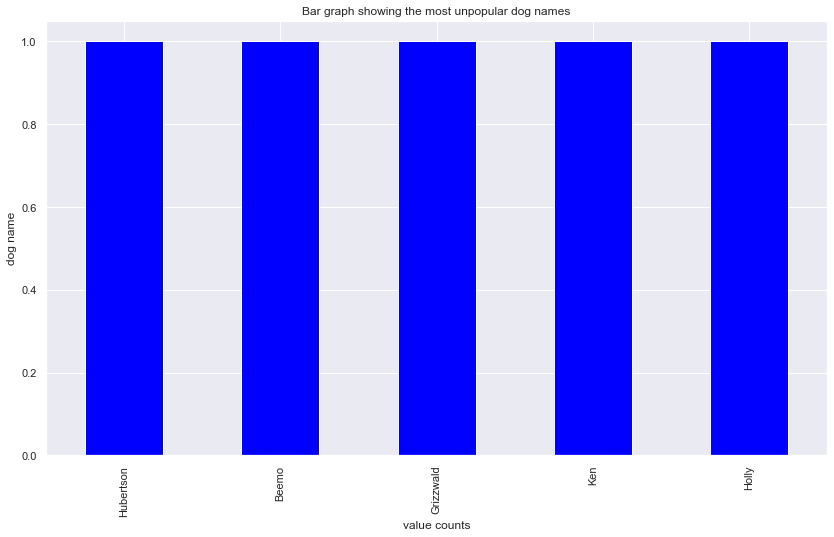

In [65]:
# let's also explore the most unpopular dogs from the dataset
plt.figure(figsize=(14,8))
df_final['name'].value_counts().tail().plot(kind="bar", color='blue')
plt.title("Bar graph showing the most unpopular dog names")
plt.xlabel('value counts')
plt.ylabel('dog name');

Therefore, these are the most unpopular dog names with their ratings

### Let see the images with the most retweets

### Top 5 high retweets id and their corresponding images from their url links

In [66]:
Top_5_retweets = (df_final.sort_values(by=['Retweet_Count'],ascending=False)).head()
Top_5_retweets

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,...,Retweet_Count,Favorite_Count,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_type
928,744234799360020481,https://pbs.twimg.com/ext_tw_video_thumb/74423...,1,Labrador retriever,0.825333,True,Ice bear,0.044681,False,Whippet,...,70870,145080,2016-06-18 18:26:18+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here's a doggo realizing you can stand in a po...,https://twitter.com/dog_rates/status/744234799...,13,10,NaN,doggo
1193,807106840509214720,https://pbs.twimg.com/ext_tw_video_thumb/80710...,1,Chihuahua,0.505370,True,Pomeranian,0.120358,True,Toy terrier,...,51759,111856,2016-12-09 06:17:20+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Stephan. He just wants to help. 13/10 ...,https://twitter.com/dog_rates/status/807106840...,13,10,Stephan,No type
1271,822872901745569793,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,1,Lakeland terrier,0.196015,True,Labrador retriever,0.160329,True,Irish terrier,...,39993,124252,2017-01-21 18:26:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here's a super supportive puppo participating ...,https://twitter.com/dog_rates/status/822872901...,13,10,NaN,puppo
1502,879415818425184262,https://pbs.twimg.com/ext_tw_video_thumb/87941...,1,English springer,0.383404,True,Boston bull,0.134967,True,Cardigan,...,37500,92962,2017-06-26 19:07:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Duddles. He did an attempt. 13/10 some...,https://twitter.com/dog_rates/status/879415818...,13,10,Duddles,No type
1191,806629075125202948,https://pbs.twimg.com/media/CzG425nWgAAnP7P.jpg,2,Arabian camel,0.366248,False,House finch,0.209852,False,Cocker spaniel,...,32449,70720,2016-12-07 22:38:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...","""Good afternoon class today we're going to lea...",https://twitter.com/dog_rates/status/806629075...,13,10,NaN,No type


In [67]:
# Top five retweets image predictions links
Top_5_retweets['jpg_url']
Top_5_retweets

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,...,Retweet_Count,Favorite_Count,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_type
928,744234799360020481,https://pbs.twimg.com/ext_tw_video_thumb/74423...,1,Labrador retriever,0.825333,True,Ice bear,0.044681,False,Whippet,...,70870,145080,2016-06-18 18:26:18+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here's a doggo realizing you can stand in a po...,https://twitter.com/dog_rates/status/744234799...,13,10,NaN,doggo
1193,807106840509214720,https://pbs.twimg.com/ext_tw_video_thumb/80710...,1,Chihuahua,0.505370,True,Pomeranian,0.120358,True,Toy terrier,...,51759,111856,2016-12-09 06:17:20+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Stephan. He just wants to help. 13/10 ...,https://twitter.com/dog_rates/status/807106840...,13,10,Stephan,No type
1271,822872901745569793,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,1,Lakeland terrier,0.196015,True,Labrador retriever,0.160329,True,Irish terrier,...,39993,124252,2017-01-21 18:26:02+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here's a super supportive puppo participating ...,https://twitter.com/dog_rates/status/822872901...,13,10,NaN,puppo
1502,879415818425184262,https://pbs.twimg.com/ext_tw_video_thumb/87941...,1,English springer,0.383404,True,Boston bull,0.134967,True,Cardigan,...,37500,92962,2017-06-26 19:07:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Duddles. He did an attempt. 13/10 some...,https://twitter.com/dog_rates/status/879415818...,13,10,Duddles,No type
1191,806629075125202948,https://pbs.twimg.com/media/CzG425nWgAAnP7P.jpg,2,Arabian camel,0.366248,False,House finch,0.209852,False,Cocker spaniel,...,32449,70720,2016-12-07 22:38:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...","""Good afternoon class today we're going to lea...",https://twitter.com/dog_rates/status/806629075...,13,10,NaN,No type


### Most retweet Image

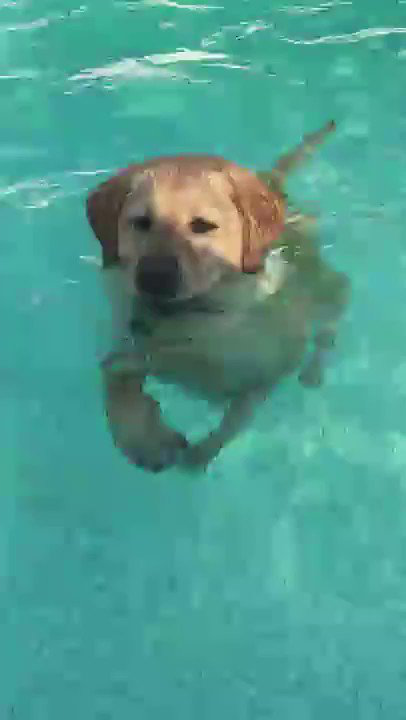

In [68]:
top_links = list(Top_5_retweets['jpg_url'])

response = requests.get(top_links[0])
img = Image.open(BytesIO(response.content))
img

### Top five Pictures/Images with high retweets

In [69]:
top_links = list(Top_5_retweets['jpg_url'])

Photos = []
for url in top_links:
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    Photos.append(image)
    

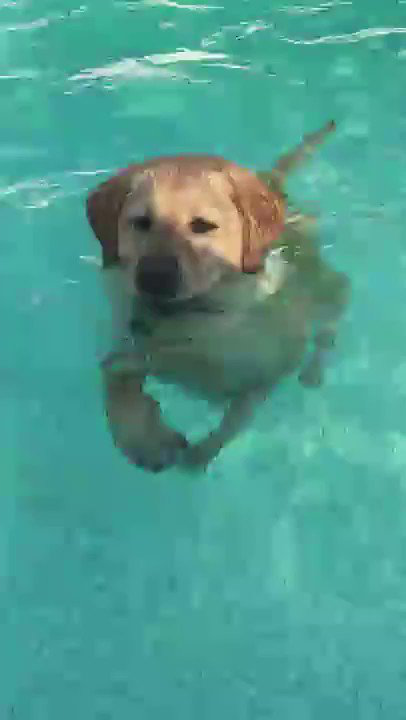

In [70]:
Photos[0]

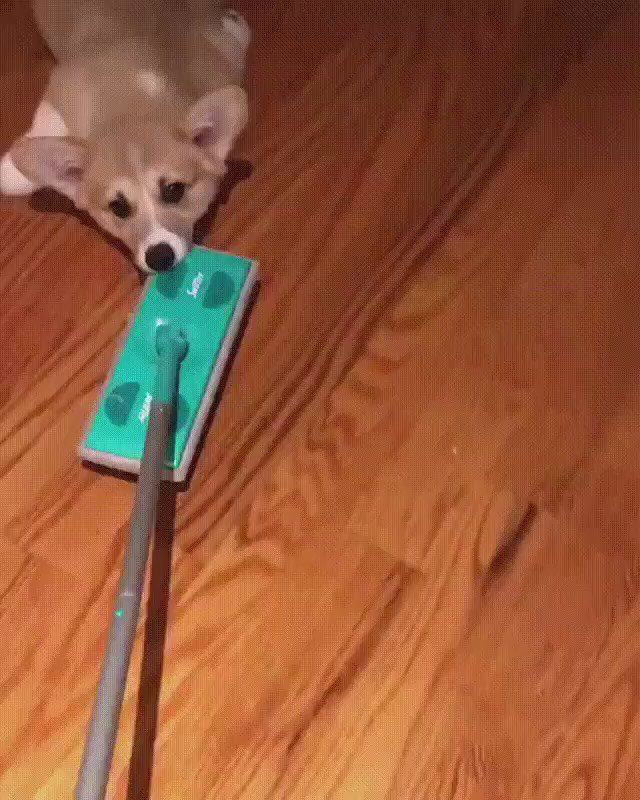

In [71]:
Photos[1]

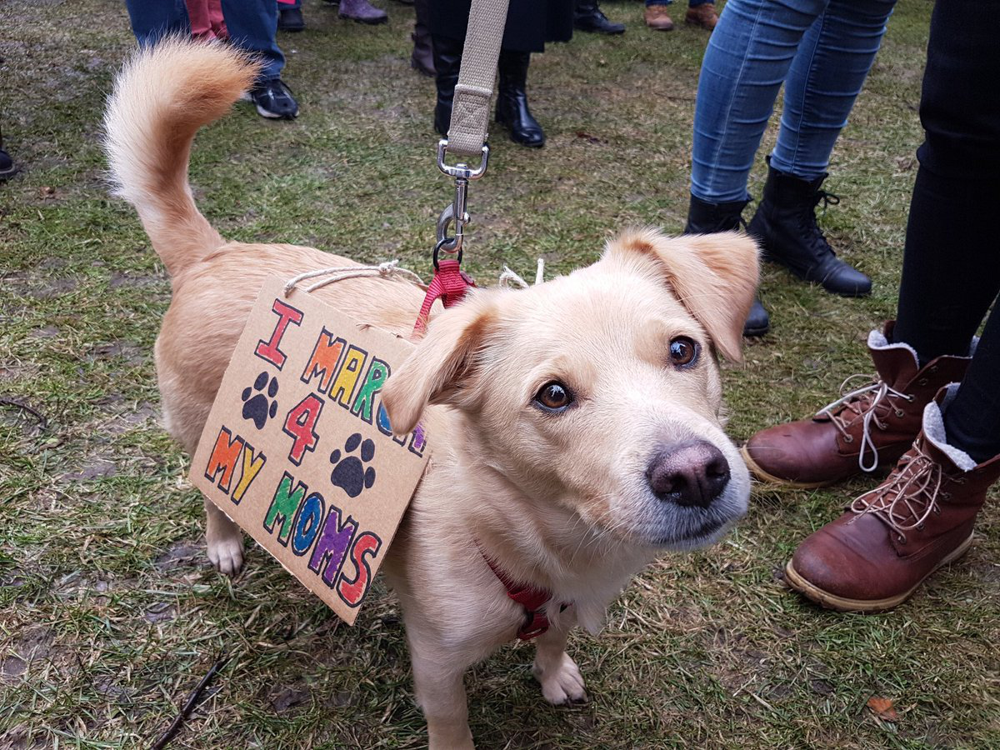

In [72]:
Photos[2]

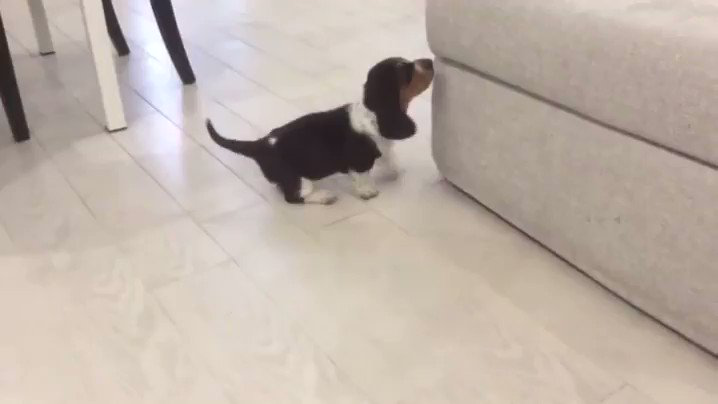

In [73]:
Photos[3]

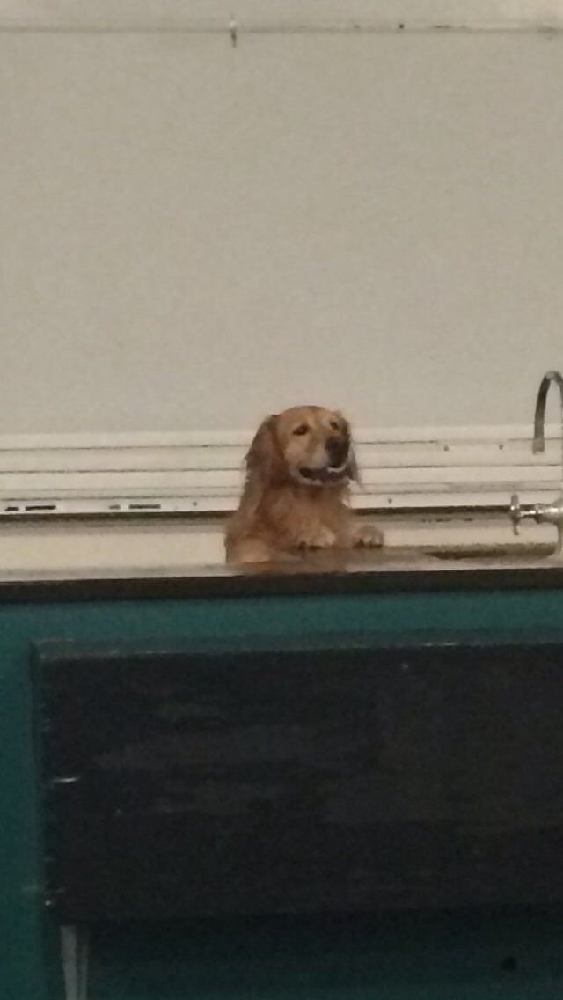

In [74]:
Photos[4]

In [75]:
# Let also analyse the relationship between Retweet count and favorite count using scatter plot

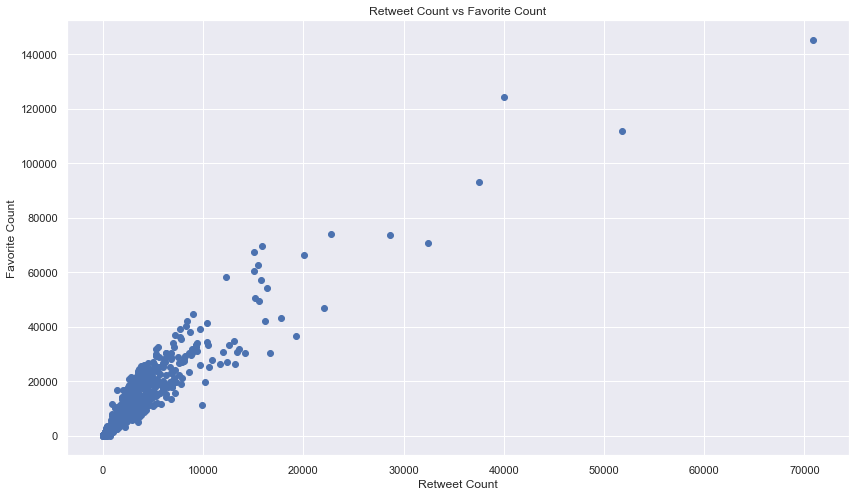

In [76]:
# let's also explore the relationship between retweet count and favorite count
plt.figure(figsize=(14,8))
plt.scatter(df_final['Retweet_Count'],df_final['Favorite_Count'])
plt.title("Retweet Count vs Favorite Count")
plt.xlabel('Retweet Count')
plt.ylabel('Favorite Count');

Thefore, we can see that there is `a strong positive correlation` between retweet count and favorite count. i.e there is a strong linear relationship between them. This is to mean that, the increase in one led to the increase in the other and vise versa.

## step 7: Reporting <a class="anchor" id="chapter6"></a>

### 7.1. Reporting data wrangling efforts <a class="anchor" id="section_16"></a>

In general, data wrangling also know as data cleaning refers to the process of cleaning and unifying dirty, messy, and complex data sets into the more usable formats for easy access and analysis. Therefore, depending on the kind of data anyone is cleaning, different strategies may be applied. In addition, depending on what we want to achieve, we apply some data cleaning strategies that help us to achieve our goal.

Indeed, in this project, the main goal was to wrangle the WeRateDogs twitter data, analyze the final data frame, get some insights from the data and share it to the team using trustworthy analyzes and some visualizations.

In this wrangling project, different steps have been performed. These are:
    1. First data should be gathered either manually or programmatically i.e it depends on the 
    sources of information. In this project, data were gather both manually downloaded and 
    others programmatically downloaded
    2. Assessing data. In this step, we use both visual assessment and programmatic assessment 
    to find some issues and note them down so that in the next step we fix those issues noted
    3. Cleaning the issues. Therefore, after noticing and noting the issues, the next step is to fix 
    them in the process called data cleaning. The final data frame is called cleaned 
    data frame and is ready for analysis 
    
    
So, in this project, three datasets were given and were used. One was downloaded manually and is called “Twitter-Archieve-enhanced.csv”, and the other two were downloaded programmatically. However, for those downloaded programmatical, one is called “Image prediction.csv” which was successfully downloaded programmatically using request and get method and the last one was “Json-API-data” which requested us to create account, and this was very difficult to me since I didn’t manage to get a working account so that I can download the data. However, I used the Json file given in one of the section of this project and manipulated it in Jupyter notebook and saved it into the pandas data frame.

In the data assessment process, I was able to use both visual and programmatic assessment on the data frames I had and then came up with some issues that should be handled. The visual assessment was done using visual detection of any issues in excel, or after reading data set into panda’s data frame and use some simple python techniques such as head method (which displays the first five rows), tail method (which displays the last five rows) and sample method (which displays a given number of rows). While for programmatic assessment, some python methods such as info, describe, isnull, duplicated, dtypes, etc were used to detect some data quality and tidiness issues. All the quality and tidiness issues obtained were listed in Quality and Tidiness issues sections

Therefore, after fixing all the issues i.e after performing data cleaning process, all the 3 data sets given were merged together to form one final cleaned data frame and stored in the file named “Twitter-Archieve-Master” which was stored in CSV format.


### 7.2. Reporting insights obtained from data analyses and visualizations <a class="anchor" id="section_17"></a>

Data analysis helps us to extract relevant information or patterns in the data we have which led to making decisions for a given organization depending on what have been found from the data. In this step, helpful visualizations are obtained which is very easy to obtain an insight from them.Therefore, after cleaning the data sets and merging them into one data frame, I was able to do some analysis trying to answer the following few questions where I have used more visualizations to show us the answer to the question asked. Here are the questions I tried to answer:

1. According to dog types, which dog type were most rated?
2. Which are the most popular (many retweets) dog names
3. Give the top 5 pictures of the most rated dogs i.e with many retweets
4. What is the relationship between retweet-count and favorite-count? Is there any relationship?

Therefore, by using some visualizations, I managed to get answers to the questions asked.

For instance, here is the answer to the first question
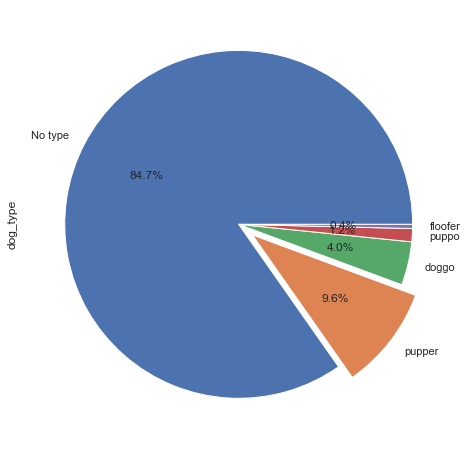

Therefore, from the graph above, we can confirm that the most rated dogs have not category i.e 
no type dogs, followed by pupper dogs, then doggo dogs, then puppo dogs and final floofer dogs 
get the smallest ratings

Here is the answer of the second question
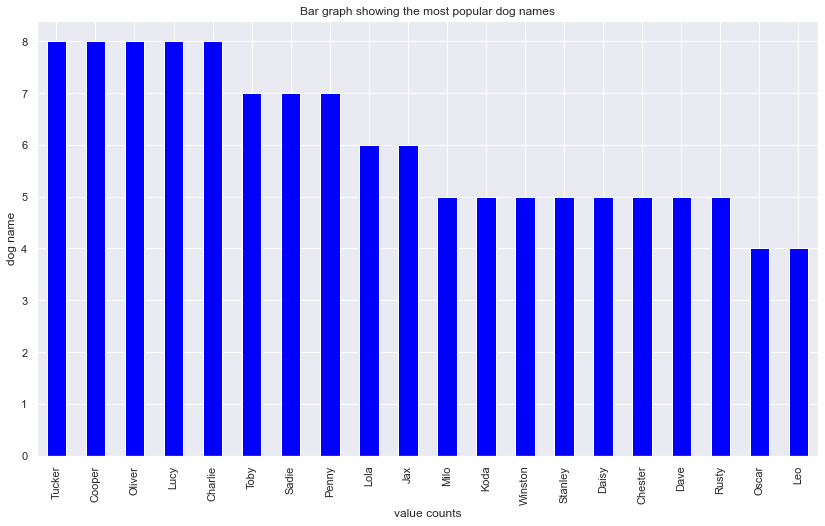

Therefore, we can see that "Lucy, Oliver and Charlie" are the most popular names followed by 
"cooper, Sadie and Tucker" and so on

Here is the answer to the third question
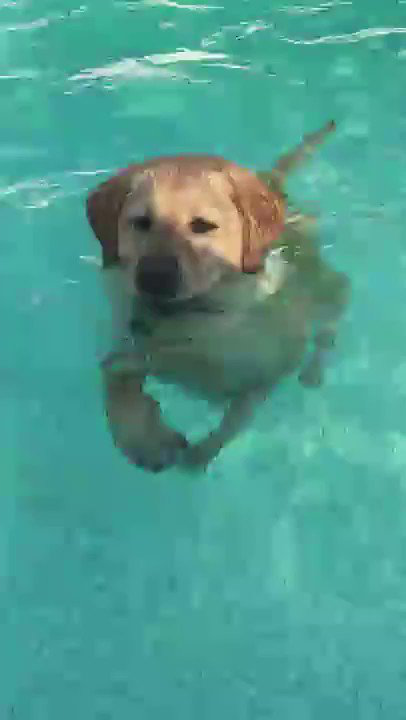
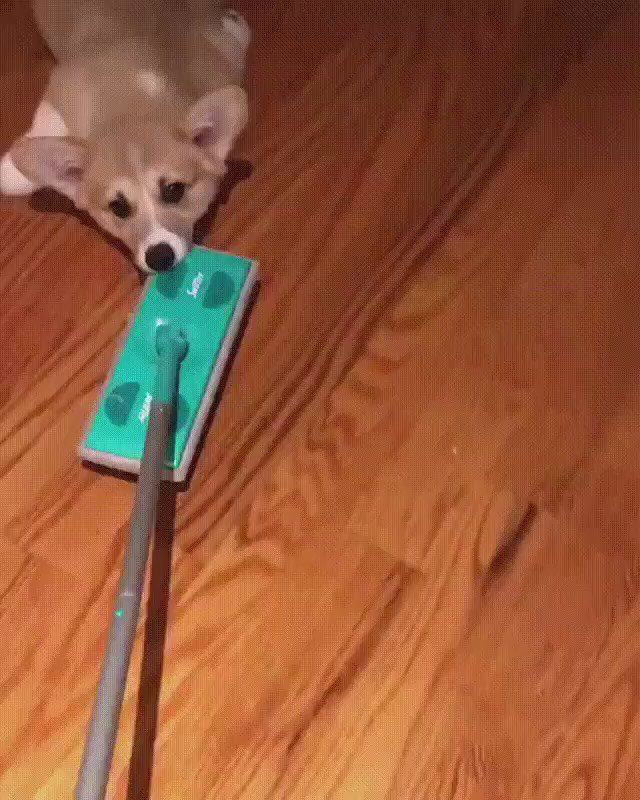
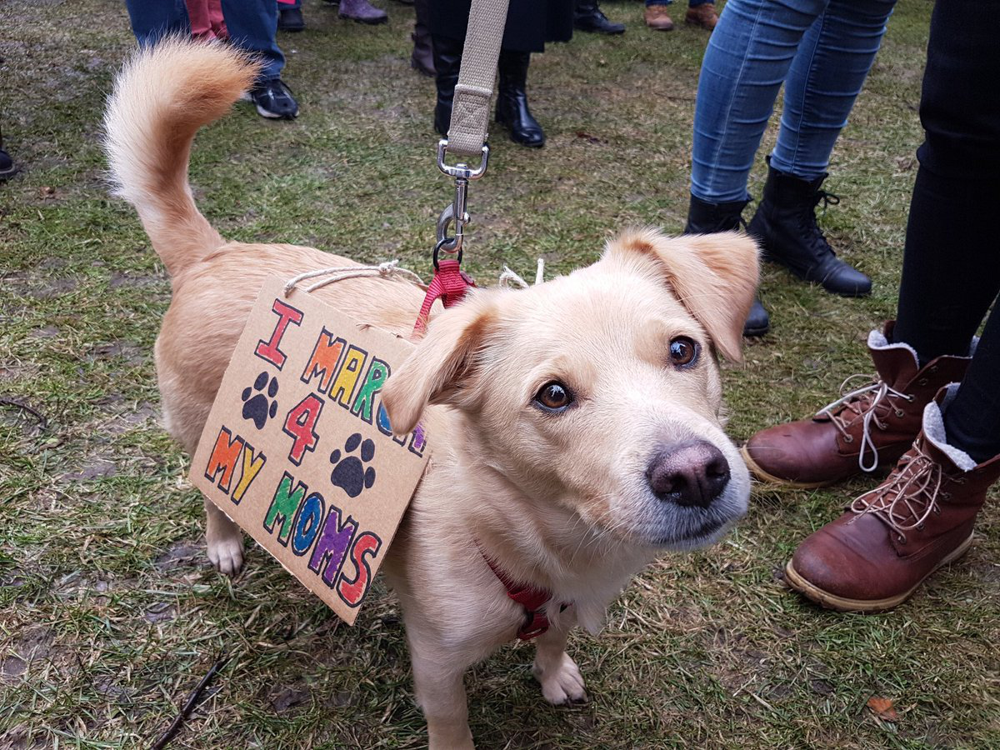
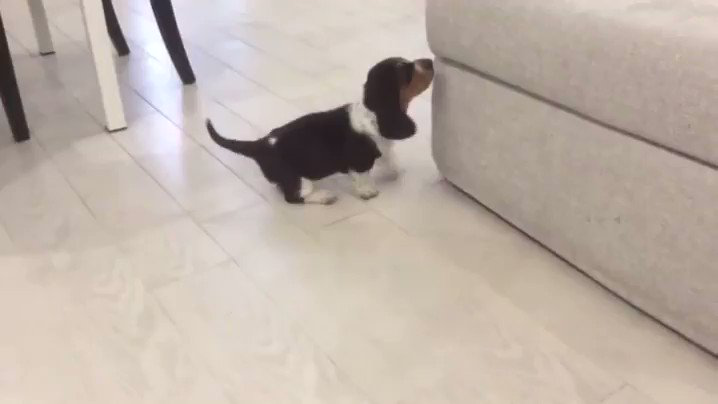
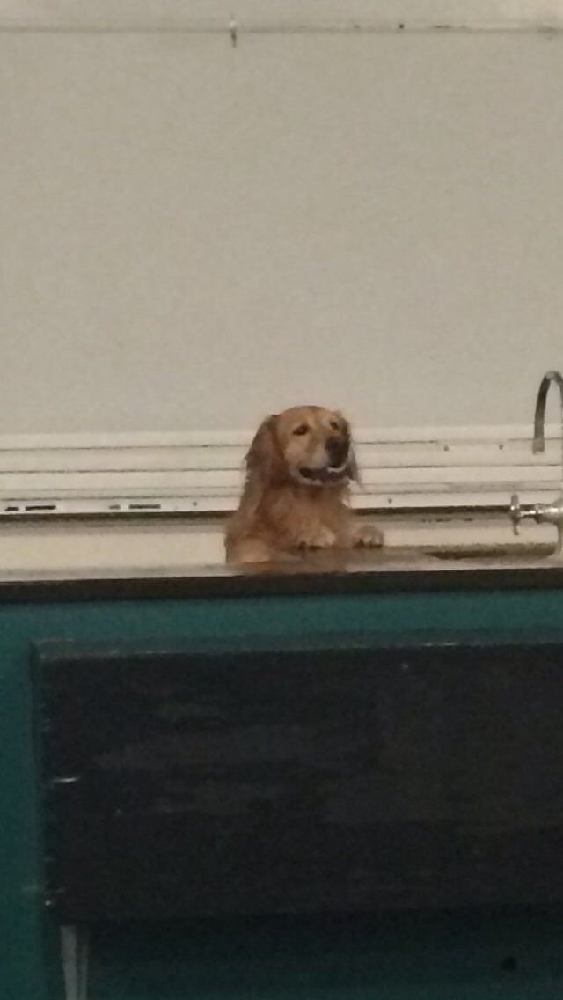


And finally, here is the answer to the forth question
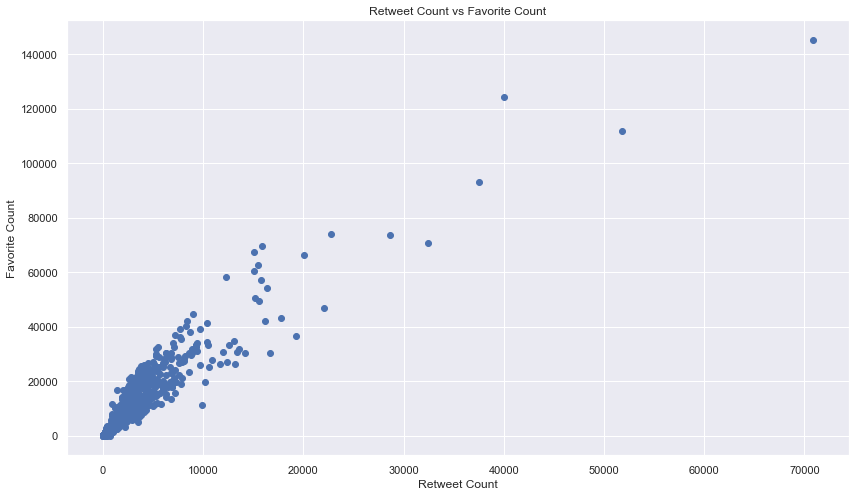

Thefore, we can see that there is `a strong positive correlation` between retweet count and 
favorite count. i.e there is a strong linear relationship between them. This is to mean that, the 
increase in one led to the increase in the other and vise versa.